# Построение модели предсказания коэффициента восстановления золота из золотосодержащей руды

## Введение

**Вводные данные проекта:**

Необходимо подготовить прототип модели машинного обучения для «Цифры» - компании, разрабатывающей решения для эффективной работы промышленных предприятий.

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. Для обучения и предсказания будем использовать данные с параметрами добычи и очистки. 

**Целью проекта** является построение модели предсказания коэффициента восстановления золота. Это позволит оптимизировать производство и минимизировать запуск предприятия с убыточными характеристиками.


**Этапы проекта:**
1. Провести предобработку данных и подготовить их к построению модели
2. Обучить и оценить результаты нескольких моделей
3. Осуществить подбор параметров для лучших моделей и выбрать одну для тестирования
4. Протестировать модель и сравнить результаты с константной моделью
5. Сделать выводы по результатам проекта

**Для работы над проектом будут использоваться следующие библиотеки**:
- для анализа и обработки данных:
    - *pandas*
    - *numpy*
    
    
- для визуализации данных:
    - *seaborn*
    - *matplotlib*
    - *plotly.express*
    
    
- для построения и оценки моделей ML:
    - *sklearn*

**Описание данных**

**Технологический процесс:**

- Rougher feed — исходное сырье
- Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant
- Xanthate **— ксантогенат (промотер, или активатор флотации);
- Sulphate — сульфат (на данном производстве сульфид натрия);
- Depressant — депрессант (силикат натрия).
- Rougher process (англ. «грубый процесс») — флотация
- Rougher tails — отвальные хвосты
- Float banks — флотационная установка
- Cleaner process — очистка
- Rougher Au — черновой концентрат золота
- Final Au — финальный концентрат золота

**Параметры этапов:**

- air amount — объём воздуха
- fluid levels — уровень жидкости
- feed size — размер гранул сырья
- feed rate — скорость подачи

**Наименование признаков:**

Наименование признаков имеет вид: [этап].[тип_параметра].[название_параметра]

Пример: rougher.input.feed_ag


Возможные значения для блока [этап]:
- rougher — флотация
- primary_cleaner — первичная очистка
- secondary_cleaner — вторичная очистка
- final — финальные характеристики

Возможные значения для блока [тип_параметра]:
- input — параметры сырья
- output — параметры продукта
- state — параметры, характеризующие текущее состояние этапа
- calculation — расчётные характеристики

## Подготовка данных

In [1]:
# импортируем необходимые библиотеки
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.metrics import mean_absolute_error, make_scorer
from sklearn.model_selection import train_test_split, GridSearchCV, KFold, cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.dummy import DummyRegressor

### Изучение общей информации о данных

**ФУНКЦИИ:**

In [2]:
def info_all(data):
    '''функция оценивает общую информацию о данных'''
    print('-'*50)
    print('Общая информация о данных')
    temp = data.copy() 
    list_c = data.columns
    print(temp.info())
    for col_l in list_c:
        print('-'* 25)
        print(col_l, temp[col_l].sort_values().unique())
        print(col_l,': кол-во NaN',temp[col_l].isna().sum(),
        ', процент NaN', round(temp[col_l].isna().sum()/len(temp)*100, 2),'%')
    print('-'*50)    
    display(data.describe()) 
    print('-'*50) 
    print('Поиск дубликатов')
    if data.duplicated().sum() == 0:
        print('Дубликаты по строкам отсутствуют')
    else:
        print('Количество дублирующихся строк:', data.duplicated().sum())
        display(data.loc[data.duplicated() == True])

In [3]:
# откроем файл с данными по обучающей выборке
#data_train = pd.read_csv('/datasets/gold_recovery_train_new.csv')
data_train = pd.read_csv('gold_recovery_train_new.csv')

# отобразим все столбцы и строки, так как датафрейм объемный
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# посмотрим общую информацию о данных
print('Обучающая выборка')
info_all(data_train)

Обучающая выборка
--------------------------------------------------
Общая информация о данных
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14149 entries, 0 to 14148
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                14149 non-null  object 
 1   final.output.concentrate_ag                         14148 non-null  float64
 2   final.output.concentrate_pb                         14148 non-null  float64
 3   final.output.concentrate_sol                        13938 non-null  float64
 4   final.output.concentrate_au                         14149 non-null  float64
 5   final.output.recovery                               14149 non-null  float64
 6   final.output.tail_ag                                14149 non-null  float64
 7   final.output.tail_pb                                14049 non-

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,14148.000000,14148.000000,13938.000000,14149.000000,14149.000000,14149.000000,14049.000000,14144.000000,14149.000000,14129.000000,14117.000000,14149.000000,14049.000000,14149.000000,14063.000000,13863.000000,14149.000000,14148.000000,14134.000000,14103.000000,14149.000000,14145.000000,14148.000000,14145.000000,14148.000000,14147.000000,14148.000000,14146.000000,14148.000000,1.414800e+04,14148.000000,14148.000000,14149.000000,14149.000000,14049.000000,14141.000000,14005.000000,14071.000000,14149.000000,14120.000000,14141.000000,14113.000000,13721.000000,14149.000000,14149.000000,14127.000000,14149.000000,14149.000000,14148.000000,14149.000000,14149.000000,14149.000000,14148.000000,14148.000000,14148.000000,14148.000000,14148.000000,14148.000000,14149.000000,14149.000000,13713.000000,14149.000000,14149.000000,14149.000000,14147.000000,14139.000000,12544.000000,14149.000000,13932.000000,14148.000000,14128.000000,14148.000000,14145.000000,14148.000000,14148.000000,14148.000000,14143.000000,14148.000000,14148.000000,14148.000000,14148.000000,14148.000000,14148

--------------------------------------------------
Поиск дубликатов
Дубликаты по строкам отсутствуют


In [4]:
# откроем файл с данными по тестовой выборке
data_test = pd.read_csv('gold_recovery_test_new.csv')

# посмотрим общую информацию о данных
print('Тестовая выборка')
info_all(data_test)

Тестовая выборка
--------------------------------------------------
Общая информация о данных
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5290 entries, 0 to 5289
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   date                                        5290 non-null   object 
 1   primary_cleaner.input.sulfate               5286 non-null   float64
 2   primary_cleaner.input.depressant            5285 non-null   float64
 3   primary_cleaner.input.feed_size             5290 non-null   float64
 4   primary_cleaner.input.xanthate              5286 non-null   float64
 5   primary_cleaner.state.floatbank8_a_air      5290 non-null   float64
 6   primary_cleaner.state.floatbank8_a_level    5290 non-null   float64
 7   primary_cleaner.state.floatbank8_b_air      5290 non-null   float64
 8   primary_cleaner.state.floatbank8_b_level    5290 non-null   floa

,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,5286.000000,5285.000000,5290.000000,5286.000000,5.290000e+03,5290.000000,5.290000e+03,5290.000000,5.290000e+03,5290.000000,5.290000e+03,5290.000000,5290.000000,5290.000000,5287.000000,5289.000000,5269.000000,5290.000000,5285.000000,5290.000000,5282.000000,5265.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5287.000000,5290.000000,5288.000000,5290.000000,5281.000000,5290.000000,5.290000e+03,5290.000000,5.290000e+03,5290.000000,5.290000e+03,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000,5290.000000
mean,174.839652,8.683596,7.266339,1.383803,1.539494e+03,-497.665883,1.545174e+03,-500.273098,1.527272e+03,-498.330680,1.544844e+03,-500.199527,9.371940,3.798082,489.800620,55.951097,37.716648,9.334682,13.855759,6.467745,13.922328,6.512103,1053.400166,-395.732530,1318.926879,-475.241428,1301.595477,-474.836671,1214.847960,-475.682272,1056.648995,-469.029688,997.949719,-470.482465,26.312630,-502.750897,21.949119,-501.987097,25.402926,-507.490314,2.098211e+01,-506.627916,1.632007e+01,-505.144570,1.373544e+01,-463.349858,12.804186,-501.329122,9.881145,-495.663398,17.304935,-501.793193
std,43.027080,3.072050,0.610219,0.643474,1.167979e+02,19.952431,1.222246e+02,32.968307,1.225380e+02,21.964876,1.247731e+02,31.045257,1.926264,0.954859,108.036326,19.081758,5.491415,1.619521,3.350852,1.065114,3.223769,0.886989,121.139309,91.085505,156.450366,45.649466,171.269667,45.859866,185.763319,47.844967,131.542839,59.325990,128.218869,60.759318,3.429852,28.756505,4.354961,34.582722,6.526457,47.620908,6.736179e+00,44.528673,3.493583e+00,31.427337,3.430484e+00,86.189107,3.026591,17.951495,2.868205,34.535007,4.536544,39.044215
min,2.566156,0.003839,5.650000,0.004984,5.445860e-32,-795.316337,6.647490e-32,-799.997015,4.033736e-32,-799.960571,4.039220e-32,-799.794250,0.568441,0.273677,0.002986,0.046369,1.393488,0.568632,0.001147,0.000568,0.000077,0.006985,-0.042069,-657.949759,-0.721806,-650.245277,-0.056636,-647.544439,-0.992219,-648.390665,-1.982295,-649.267537,-2.593390,-649.949283,0.20

--------------------------------------------------
Поиск дубликатов
Дубликаты по строкам отсутствуют


In [5]:
# откроем файл с исходным датасетом
#data_full = pd.read_csv('/datasets/gold_recovery_full_new.csv')
data_full = pd.read_csv('gold_recovery_full_new.csv')
# посмотрим общую информацию о данных
print('Исходный датасет')
info_all(data_full)

Исходный датасет
--------------------------------------------------
Общая информация о данных
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19439 entries, 0 to 19438
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                19439 non-null  object 
 1   final.output.concentrate_ag                         19438 non-null  float64
 2   final.output.concentrate_pb                         19438 non-null  float64
 3   final.output.concentrate_sol                        19228 non-null  float64
 4   final.output.concentrate_au                         19439 non-null  float64
 5   final.output.recovery                               19439 non-null  float64
 6   final.output.tail_ag                                19438 non-null  float64
 7   final.output.tail_pb                                19338 non-n

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
count,19438.000000,19438.000000,19228.000000,19439.000000,19439.000000,19438.000000,19338.000000,19433.000000,19439.000000,19415.000000,19402.000000,19439.000000,19335.000000,19439.000000,19323.000000,19069.000000,19439.000000,19435.000000,19418.000000,19377.000000,19439.000000,1.943500e+04,19438.000000,1.943500e+04,19438.000000,1.943700e+04,19438.000000,1.943600e+04,19438.000000,1.943700e+04,19437.000000,19437.000000,19439.000000,19439.000000,19339.000000,19428.000000,19294.000000,19340.000000,19439.000000,19405.000000,19431.000000,19395.000000,18986.000000,19439.000000,19439.000000,19416.000000,19439.000000,19439.000000,19438.000000,19439.000000,19439.000000,19439.000000,19438.000000,19438.000000,19438.000000,19438.000000,19438.000000,19438.000000,19439.000000,19439.000000,19003.000000,19439.000000,19439.000000,19439.000000,19437.000000,19427.000000,17691.000000,19439.000000,19219.000000,19438.000000,19416.000000,19438.000000,19426.000000,19438.000000,19438.000000,19438.000000,19433.000000,19438.000000,19438.000000,19438.000000,19438.000000,19438.000000,19438

--------------------------------------------------
Поиск дубликатов
Дубликаты по строкам отсутствуют


**Вывод по результатам общей информации о данных:**
- в данных есть пропуски, необходимо более детально проанализировать их и принять решение - удалять их или заполнять.
- дату сделать индексом - она не будет использована для обучения модели
- проанализировать какие признаки будут нужны при обучении модели и отсутствующие в тестовых данных

### Проверка расчета эффективности обогащения 

Проверим, что эффективность обогащения рассчитана правильно. Вычислим её на обучающей выборке для признака rougher.output.recovery. Найдем MAE между нашими расчётами и значением признака.

Формула расчета эффективности обогащения:

recovery = (C * (F - T))/(F * (C - T))*100%

- C — доля золота в концентрате после флотации/очистки;
- F — доля золота в сырье/концентрате до флотации/очистки;
- T — доля золота в отвальных хвостах после флотации/очистки.

In [6]:
# найдем необходимые переменные для расчета эффективности обогащения
C = data_train.loc[data_train['rougher.output.recovery'].isna()==False]['rougher.output.concentrate_au']
F = data_train.loc[data_train['rougher.output.recovery'].isna()==False]['rougher.input.feed_au']
T = data_train.loc[data_train['rougher.output.recovery'].isna()==False]['rougher.output.tail_au']

In [7]:
# рассчитаем recovery
recovery = (C * (F - T))/(F * (C - T))*100

In [8]:
recovery_target = data_train.loc[data_train['rougher.output.recovery'].isna()==False]['rougher.output.recovery']

In [9]:
# рассчитаем MAE
print(mean_absolute_error(recovery_target, recovery))

9.73512347450521e-15


**Вывод по корректности расчета эффективности обогащения:**

MAE имеет практически 0 значение с небольшой погрешностью, что допустимо при округлении. Из этого следует, что признак rougher.output.recovery рассчитан верно.

### Анализ признаков, отсутствующих в тестовой выборке

In [10]:
# оценим количество отсутствующих признаков в тестовой выборке
data_train.shape[1] - data_test.shape[1]

34

In [11]:
# посмотрим список этих признаков
data_train.columns.drop(data_test.columns)

Index(['final.output.concentrate_ag', 'final.output.concentrate_pb',
       'final.output.concentrate_sol', 'final.output.concentrate_au',
       'final.output.recovery', 'final.output.tail_ag', 'final.output.tail_pb',
       'final.output.tail_sol', 'final.output.tail_au',
       'primary_cleaner.output.concentrate_ag',
       'primary_cleaner.output.concentrate_pb',
       'primary_cleaner.output.concentrate_sol',
       'primary_cleaner.output.concentrate_au',
       'primary_cleaner.output.tail_ag', 'primary_cleaner.output.tail_pb',
       'primary_cleaner.output.tail_sol', 'primary_cleaner.output.tail_au',
       'rougher.calculation.sulfate_to_au_concentrate',
       'rougher.calculation.floatbank10_sulfate_to_au_feed',
       'rougher.calculation.floatbank11_sulfate_to_au_feed',
       'rougher.calculation.au_pb_ratio', 'rougher.output.concentrate_ag',
       'rougher.output.concentrate_pb', 'rougher.output.concentrate_sol',
       'rougher.output.concentrate_au', 'rougher.outpu

В тестовой выборке отсутствуют признаки, относящиеся к типу output (параметры продукта после каждого этапа обработки) - rougher (флотация), primary_cleaner (первичная очистка), secondary_cleaner (вторичная очистка), final (финальные характеристики), а также расчетные характеристики (calculation) на этапе флотации.

Отсутствие этих признаков в тестовой выборке означает, что из обучающей их также необходимо удалить (кроме таргетов - rougher.output.recovery и final.output.recovery), иначе не удастся построить модель.

In [12]:
# удалим эти признаки
drop_list = data_train.columns.drop(data_test.columns).drop(['rougher.output.recovery', 'final.output.recovery'])
data_train.drop(drop_list, axis=1, inplace=True)
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14149 entries, 0 to 14148
Data columns (total 55 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   date                                        14149 non-null  object 
 1   final.output.recovery                       14149 non-null  float64
 2   primary_cleaner.input.sulfate               14129 non-null  float64
 3   primary_cleaner.input.depressant            14117 non-null  float64
 4   primary_cleaner.input.feed_size             14149 non-null  float64
 5   primary_cleaner.input.xanthate              14049 non-null  float64
 6   primary_cleaner.state.floatbank8_a_air      14145 non-null  float64
 7   primary_cleaner.state.floatbank8_a_level    14148 non-null  float64
 8   primary_cleaner.state.floatbank8_b_air      14145 non-null  float64
 9   primary_cleaner.state.floatbank8_b_level    14148 non-null  float64
 10  primary_cl

### Предобработка данных

Проведем предобработку данных со следующими этапами:
1. Осуществим подбор признаков для обучения модели - оценим корреляцию признаков с целевыми и оставим те, которые взаимосвязаны
2. Проверим не коррелириуются ли отобранные признаки между собой, при необходимости удалим их, так как это только усложнит обучение модели
3. Оценим общее количество пропусков в отобранных признаках, посмотрим на распределение значений признаков (боксплот)

#### Подбор признаков для обучения модели

In [13]:
# установим даты в качестве индексов
data_train.set_index('date', inplace=True)
data_test.set_index('date', inplace=True)
data_full.set_index('date', inplace=True)

In [14]:
# посмотрим корреляцию признаков между собой
# создадим функцию для оценки корреляции по заданным границам
def corr(data, ge, ne):
    ''' показывает корреляцию по заданным границам'''
    cor_matrix = data.corr().abs()
    m1 = np.triu(np.ones(cor_matrix.shape).astype(bool))
    m2 = cor_matrix.abs().ge(float(ge))
    m3 = cor_matrix.abs().ne(float(ne))
    return cor_matrix.where(m1&m2&m3).stack()

In [15]:
print('Корреляция целевого признака final.output.recovery с прочими признаками')
try:
    print(corr(data_train, 0.7, 1.0)['final.output.recovery'])
except: 
    print('Корреляция отсутствует')

Корреляция целевого признака final.output.recovery с прочими признаками
Корреляция отсутствует


In [16]:
print('Корреляция целевого признака rougher.output.recovery с прочими признаками')
try:
    print(corr(data_train, 0.7, 1.0)['rougher.output.recovery'])
except: 
    print('Корреляция отсутствует')

Корреляция целевого признака rougher.output.recovery с прочими признаками
Корреляция отсутствует


In [17]:
# проверим мультиколлениарность между нецелевыми признаками
print('Корреляция признаков')
print(corr(data_train, 0.90, 1.0))

Корреляция признаков
primary_cleaner.state.floatbank8_a_air      primary_cleaner.state.floatbank8_b_air        0.945316
                                            primary_cleaner.state.floatbank8_c_air        0.934555
primary_cleaner.state.floatbank8_a_level    primary_cleaner.state.floatbank8_b_level      0.958855
                                            primary_cleaner.state.floatbank8_c_level      0.958372
primary_cleaner.state.floatbank8_b_air      primary_cleaner.state.floatbank8_c_air        0.939608
primary_cleaner.state.floatbank8_b_level    primary_cleaner.state.floatbank8_c_level      0.938446
rougher.input.floatbank10_xanthate          rougher.input.floatbank11_xanthate            0.940049
rougher.state.floatbank10_b_air             rougher.state.floatbank10_c_air               0.937161
                                            rougher.state.floatbank10_d_air               0.928081
rougher.state.floatbank10_b_level           rougher.state.floatbank10_c_level           

Существует сильная зависимость между однотипными признаками, например, параметры флотационной установки ( primary_cleaner.state.floatbank8_a_air и  primary_cleaner.state.floatbank8_b_air).

Исключим однотипные признаки с мультиколлениарностью из данной выборки (корреляция более 0.9). 

**Стоит заметить, что сильная взаимосвязь признаков в этой выборке не означает, что их нужно удалять и в последующих. Нужно внимательно отслеживать корреляцию при обновлении данных обучающей выборки.**

In [18]:
# создадим список признаков для удаления из обучающей и тестовой выборок
col_drop = ['primary_cleaner.state.floatbank8_b_air', 'primary_cleaner.state.floatbank8_c_air', 
            'primary_cleaner.state.floatbank8_b_level', 'primary_cleaner.state.floatbank8_c_level', 
            'rougher.input.floatbank11_xanthate', 'rougher.state.floatbank10_c_air', 
            'rougher.state.floatbank10_d_air', 'rougher.state.floatbank10_c_level', 'rougher.state.floatbank10_d_level', 
            'rougher.state.floatbank10_e_level', 'rougher.state.floatbank10_f_level', 'rougher.state.floatbank10_f_air', 
            'secondary_cleaner.state.floatbank2_b_level']

Удалять их пока не будем, так как они могут понадобиться нам для заполнения пропусков в данных.

#### Анализ пропусков и аномалий

##### Оценка количества пропусков

In [19]:
print('Количество пропусков в обучающей выборке:')
print(data_train.isna().sum().sort_values(ascending=False))

Количество пропусков в обучающей выборке:
rougher.state.floatbank10_e_air               436
rougher.input.floatbank11_xanthate            428
secondary_cleaner.state.floatbank2_a_air      217
rougher.input.feed_size                       144
rougher.input.feed_pb                         100
primary_cleaner.input.xanthate                100
rougher.input.feed_sol                         78
rougher.input.floatbank11_sulfate              36
primary_cleaner.input.depressant               32
rougher.input.floatbank10_sulfate              29
secondary_cleaner.state.floatbank2_b_air       21
primary_cleaner.input.sulfate                  20
rougher.input.floatbank10_xanthate              8
rougher.input.feed_rate                         8
secondary_cleaner.state.floatbank4_a_air        6
primary_cleaner.state.floatbank8_b_air          4
primary_cleaner.state.floatbank8_a_air          4
secondary_cleaner.state.floatbank3_a_air        4
primary_cleaner.state.floatbank8_d_air          3
primary_

In [20]:
# оценим общее количество пропусков в обучающей выборке
count_train_isna = data_train.isna().sum().sum()
print('Общее количество пропусков в обучающей выборке:', count_train_isna)
print('Доля пропусков в обучающей выборке:', round(count_train_isna/data_train.shape[0]*100, 3), '%')

Общее количество пропусков в обучающей выборке: 1705
Доля пропусков в обучающей выборке: 12.05 %


In [21]:
print('Количество пропусков в тестовой выборке:')
print(data_test.isna().sum().sort_values(ascending=False))

Количество пропусков в тестовой выборке:
rougher.input.floatbank11_xanthate            25
rougher.input.feed_sol                        21
secondary_cleaner.state.floatbank3_a_air       9
rougher.input.floatbank11_sulfate              8
primary_cleaner.input.depressant               5
rougher.input.floatbank10_sulfate              5
primary_cleaner.input.sulfate                  4
primary_cleaner.input.xanthate                 4
rougher.input.feed_rate                        3
secondary_cleaner.state.floatbank2_a_air       3
secondary_cleaner.state.floatbank2_b_air       2
rougher.input.feed_size                        1
secondary_cleaner.state.floatbank3_b_level     0
secondary_cleaner.state.floatbank3_b_air       0
rougher.state.floatbank10_f_air                0
rougher.state.floatbank10_f_level              0
secondary_cleaner.state.floatbank6_a_air       0
secondary_cleaner.state.floatbank5_b_level     0
secondary_cleaner.state.floatbank2_a_level     0
secondary_cleaner.state.floa

In [22]:
# оценим общее количество пропусков в тестовой выборке
count_test_isna = data_test.isna().sum().sum()
print('Общее количество пропусков в тестовой выборке:', count_test_isna)
print('Доля пропусков в тестовой выборке:', round(count_test_isna/data_test.shape[0]*100, 3), '%')

Общее количество пропусков в тестовой выборке: 90
Доля пропусков в тестовой выборке: 1.701 %


Количество пропущенных значений достаточно большое, при этом большая часть в обучающей выборке (судя по доле пропущенных значений). 

Создадим копию исходных данных и уберем оттуда признаки с высокой корреляцией, посмотрим пропуски по оставшимся признакам. Далее проверим наличие признаков с высокой корреляцией и аналогичным технологическим процессом - если они имеются, и за нужный период данные присутствуют, то заполним пропуски ими.

In [23]:
data_full_new = data_full.copy(deep=True)

In [24]:
data_full_new.drop(col_drop, axis=1, inplace=True)

In [25]:
data_full_new.drop(drop_list, axis=1, inplace=True)

In [26]:
data_full_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 19439 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 41 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   final.output.recovery                       19439 non-null  float64
 1   primary_cleaner.input.sulfate               19415 non-null  float64
 2   primary_cleaner.input.depressant            19402 non-null  float64
 3   primary_cleaner.input.feed_size             19439 non-null  float64
 4   primary_cleaner.input.xanthate              19335 non-null  float64
 5   primary_cleaner.state.floatbank8_a_air      19435 non-null  float64
 6   primary_cleaner.state.floatbank8_a_level    19438 non-null  float64
 7   primary_cleaner.state.floatbank8_d_air      19436 non-null  float64
 8   primary_cleaner.state.floatbank8_d_level    19438 non-null  float64
 9   rougher.input.feed_ag                       19439 non-nu

In [27]:
print('Количество пропусков в исходных данных:')
print(data_full_new.isna().sum().sort_values(ascending=False))

Количество пропусков в исходных данных:
rougher.state.floatbank10_e_air               436
secondary_cleaner.state.floatbank2_a_air      220
rougher.input.feed_size                       145
primary_cleaner.input.xanthate                104
rougher.input.feed_pb                         100
rougher.input.feed_sol                         99
rougher.input.floatbank11_sulfate              44
primary_cleaner.input.depressant               37
rougher.input.floatbank10_sulfate              34
primary_cleaner.input.sulfate                  24
secondary_cleaner.state.floatbank2_b_air       23
secondary_cleaner.state.floatbank3_a_air       13
rougher.input.feed_rate                        11
rougher.input.floatbank10_xanthate              8
secondary_cleaner.state.floatbank4_a_air        6
primary_cleaner.state.floatbank8_a_air          4
primary_cleaner.state.floatbank8_d_air          3
secondary_cleaner.state.floatbank6_a_air        2
secondary_cleaner.state.floatbank3_b_level      1
secondary_

Проверим корреляцию признаков с пропусками более 50.

Самое большое количество пропусков в признаке rougher.state.floatbank10_e_air. Посмотрим его корреляцию с другими признаками в исходном датасете.

In [28]:
data_full.corr()['rougher.state.floatbank10_e_air'].abs().sort_values(ascending=False).head()

rougher.state.floatbank10_e_air    1.000000
rougher.state.floatbank10_f_air    0.938207
rougher.state.floatbank10_d_air    0.866272
rougher.state.floatbank10_b_air    0.829486
rougher.state.floatbank10_c_air    0.794282
Name: rougher.state.floatbank10_e_air, dtype: float64

Признак коррелируется с rougher.state.floatbank10_f_air, который мы планировали удалить. Посмотрим заполнены ли по нему значения в местах пропусков.

In [29]:
data_train.loc[data_train['rougher.state.floatbank10_e_air'].isna()]['rougher.state.floatbank10_f_air'].isna().sum()

0

In [30]:
data_train.head()

,final.output.recovery,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.recovery,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,70.541216,127.092003,10.128295,7.25,0.988759,1549.775757,-498.912140,1551.434204,-516.403442,1549.873901,-498.666595,1554.367432,-493.428131,6.100378,2.284912,523.546326,55.486599,36.808594,6.486150,11.986616,6.007990,11.836743,6.005818,87.107763,999.706909,-404.066986,1603.011353,-434.715027,1602.375000,-442.204468,1598.937256,-451.294128,1404.472046,-455.462982,1416.354980,-451.939636,25.853109,-498.526489,23.893660,-501.406281,23.961798,-495.262817,21.940409,-499.340973,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,69.266198,125.629232,10.296251,7.25,1.002663,1576.166671,-500.904965,1575.950626,-499.865889,1575.994189,-499.315107,1574.479259,-498.931665,6.161113,2.266033,525.290581,57.278666,35.753385,6.478583,11.971193,6.005766,11.996163,6.012594,86.843261,1000.286398,-400.065196,1600.754587,-449.953435,1600.479580,-449.830646,1600.527589,-449.953649,1399.227084,-450.869848,1399.719514,-450.119001,25.880539,-499.989656,23.889530,-500.372428,23.970550,-500.085473,22.085714,-499.446897,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,68.116445,123.819808,11.316280,7.25,0.991265,1601.556163,-499.997791,1600.386685,-500.607762,1602.003542,-500.870069,1599.541515,-499.827444,6.116455,2.159622,530.026610,57.510649,35.971630,6.362222,11.920603,6.197377,11.920305,6.204633,86.842308,999.719565,-400.074028,1599.337330,-450.008530,1599.672797,-449.954491,1599.849325,-449.954185,1399.180945,-449.937588,1400.316682,-450.527147,26.005245,-499.929616,23.886657,-499.951928,23.913535,-499.442343,23.957717,-499.901982,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,68.347543,122.270188,11.322140,7.25,0.996739,1599.968720,-500.951778,1600.659236,-499.677094,1600.304144,-500.727997,1600.449520,-500.052575,6.043309,2.037807,542.590390,57.792734,

Данные заполнены по пропускам, но нужно удостовериться, что разница в данных не велика и выражена в тех же величинах.

In [31]:
# рассчитаем MAE
mae_floatbank10_e_air = mean_absolute_error(data_train.loc[data_train['rougher.state.floatbank10_e_air'].
                                                                        isna()==False]['rougher.state.floatbank10_e_air'],
                          data_train.loc[data_train['rougher.state.floatbank10_e_air'].
                                        isna()==False]['rougher.state.floatbank10_f_air'])
print(mae_floatbank10_e_air)

49.614274121571626


Чтобы оценить большое ли это отклонение, посмотрим медианное значение признака.

In [32]:
data_train.describe()['rougher.state.floatbank10_e_air']

count    13713.000000
mean      1090.213187
std        184.610118
min         -1.970275
25%        997.183864
50%       1050.496363
75%       1200.047746
max       1922.636637
Name: rougher.state.floatbank10_e_air, dtype: float64

In [33]:
# рассчитаем процент отклонения от медианного значения
round(mae_floatbank10_e_air/data_train['rougher.state.floatbank10_e_air'].median(),2)

0.05

Отклонение около 5%, примем такое допущение и заполним пропуски.

In [34]:
# заполним пропуски
data_train['rougher.state.floatbank10_e_air'] = data_train['rougher.state.floatbank10_e_air']\
.fillna(data_train['rougher.state.floatbank10_f_air'])

Проверим корреляцию по признаку secondary_cleaner.state.floatbank2_a_air

In [35]:
data_full.corr()['secondary_cleaner.state.floatbank2_a_air'].abs().sort_values(ascending=False).head()

secondary_cleaner.state.floatbank2_a_air      1.000000
secondary_cleaner.state.floatbank2_b_air      0.883753
secondary_cleaner.state.floatbank2_b_level    0.511211
secondary_cleaner.state.floatbank2_a_level    0.509504
secondary_cleaner.state.floatbank4_a_air      0.473545
Name: secondary_cleaner.state.floatbank2_a_air, dtype: float64

Признак коррелируется с secondary_cleaner.state.floatbank2_b_air. Оценим возможность заполнения пропусков аналогично.

In [36]:
data_train.loc[data_train['secondary_cleaner.state.floatbank2_a_air']
               .isna()]['secondary_cleaner.state.floatbank2_b_air'].isna().sum()

6

Имеются пропуски, но большинство значений заполнены.

In [37]:
# рассчитаем MAE
mae_floatbank2_a_air = mean_absolute_error(data_train.loc[(data_train['secondary_cleaner.state.floatbank2_a_air'].
                                                          isna()==False) & (data_train['secondary_cleaner.state.floatbank2_b_air'].
                                                          isna()==False)]['secondary_cleaner.state.floatbank2_a_air'],
                                           data_train.loc[(data_train['secondary_cleaner.state.floatbank2_a_air'].
                                                          isna()==False) & (data_train['secondary_cleaner.state.floatbank2_b_air'].
                                                          isna()==False)]['secondary_cleaner.state.floatbank2_b_air'])
print(mae_floatbank2_a_air)

4.7772784989433115


In [38]:
data_train.describe()['secondary_cleaner.state.floatbank2_a_air']

count    13932.000000
mean        29.613649
std          5.800494
min          0.077503
25%         25.099584
50%         30.027721
75%         34.893057
max         52.651399
Name: secondary_cleaner.state.floatbank2_a_air, dtype: float64

In [39]:
# рассчитаем процент отклонения от медианного значения
round(mae_floatbank2_a_air/data_train['secondary_cleaner.state.floatbank2_a_air'].median(),2)

0.16

Отклонение в 16% - это уже не мало. Так как в условиях указано, что соседние по времени параметры часто похожи, то попробуем заполнить пропущенные значения ранее зафиксированными и сравним описания данных - изменилось ли среднее, медиана, стандартное отклонение и т.д.

In [40]:
# заполнение вышестоящими значениями в столбце
data_train['secondary_cleaner.state.floatbank2_a_air'] = data_train['secondary_cleaner.state.floatbank2_a_air']\
.fillna(method='ffill')
data_train['secondary_cleaner.state.floatbank2_a_air'].describe()

count    14149.000000
mean        29.685606
std          5.812810
min          0.077503
25%         25.107090
50%         30.034084
75%         34.902699
max         52.651399
Name: secondary_cleaner.state.floatbank2_a_air, dtype: float64

Существенных отклонений нет, заполняем пропуски вышестоящими значениями.

Далее проанализируем признак rougher.input.feed_size.

In [41]:
data_full.corr()['rougher.input.feed_size'].abs().sort_values(ascending=False).head()

rougher.input.feed_size              1.000000
secondary_cleaner.output.tail_sol    0.310050
rougher.output.tail_ag               0.281209
rougher.state.floatbank10_a_level    0.250656
final.output.concentrate_sol         0.209526
Name: rougher.input.feed_size, dtype: float64

Подходящего столбца с высокой корреляции нет, попробуем заполнить вышестоящими значениями.

In [42]:
data_train['rougher.input.feed_size'].describe()

count    14005.000000
mean        60.110518
std         22.418485
min          9.659576
25%         48.973027
50%         55.373885
75%         66.080172
max        484.967466
Name: rougher.input.feed_size, dtype: float64

In [43]:
# заполнение вышестоящими значениями в столбце
data_train['rougher.input.feed_size'] = data_train['rougher.input.feed_size'].fillna(method='ffill')
data_train['rougher.input.feed_size'].describe()

count    14149.000000
mean        60.239856
std         23.005310
min          9.659576
25%         48.966751
50%         55.269784
75%         66.007526
max        484.967466
Name: rougher.input.feed_size, dtype: float64

Имеются небольшие изменения в стандартном отклонении, но, за неимением лучшего варианта заполнения, применим этот способ.

Следующий признак primary_cleaner.input.xanthate.

In [44]:
data_full.corr()['primary_cleaner.input.xanthate'].abs().sort_values(ascending=False).head()

primary_cleaner.input.xanthate        1.000000
primary_cleaner.input.sulfate         0.463401
rougher.input.floatbank10_xanthate    0.416245
rougher.input.floatbank11_xanthate    0.414596
rougher.input.feed_rate               0.343519
Name: primary_cleaner.input.xanthate, dtype: float64

Признака с высокой корреляцией не выявлено. Пробуем заполнить вышестоящими значениями.

In [45]:
data_train['primary_cleaner.input.xanthate'].describe()

count    14049.000000
mean         0.885588
std          0.372714
min          0.000005
25%          0.607021
50%          0.888749
75%          1.100933
max          2.512968
Name: primary_cleaner.input.xanthate, dtype: float64

In [46]:
# заполнение вышестоящими значениями в столбце
data_train['primary_cleaner.input.xanthate'] = data_train['primary_cleaner.input.xanthate'].fillna(method='ffill')
data_train['primary_cleaner.input.xanthate'].describe()

count    14149.000000
mean         0.881455
std          0.375683
min          0.000005
25%          0.604805
50%          0.887473
75%          1.100079
max          2.512968
Name: primary_cleaner.input.xanthate, dtype: float64

Существенных изменений в описании данных нет, заполняем пропуски.

Следующий признак rougher.input.feed_pb.

In [47]:
data_full.corr()['rougher.input.feed_pb'].abs().sort_values(ascending=False).head()

rougher.input.feed_pb              1.000000
final.output.tail_pb               0.773465
rougher.input.feed_au              0.687003
rougher.calculation.au_pb_ratio    0.542522
primary_cleaner.input.sulfate      0.511795
Name: rougher.input.feed_pb, dtype: float64

Аналогичного признака с высокой корреляцией не выявлено.

In [48]:
data_train['rougher.input.feed_pb'].describe()

count    14049.000000
mean         3.522778
std          1.073394
min          0.010000
25%          2.780010
50%          3.422677
75%          4.226107
max          7.142594
Name: rougher.input.feed_pb, dtype: float64

In [49]:
data_train['rougher.input.feed_pb'] = data_train['rougher.input.feed_pb'].fillna(method='ffill')
data_train['rougher.input.feed_pb'].describe()

count    14149.000000
mean         3.505465
std          1.090064
min          0.010000
25%          2.766515
50%          3.414267
75%          4.220115
max          7.142594
Name: rougher.input.feed_pb, dtype: float64

Существенного влияния на описание данных признака нет, поэтому заполняем пропуски.

Следующий признак rougher.input.feed_sol.

In [50]:
data_full.corr()['rougher.input.feed_sol'].abs().sort_values(ascending=False).head()

rougher.input.feed_sol                1.000000
rougher.input.feed_rate               0.621676
rougher.output.tail_sol               0.503941
primary_cleaner.input.sulfate         0.398643
rougher.input.floatbank10_xanthate    0.383095
Name: rougher.input.feed_sol, dtype: float64

Аналогичных признаков нет.

In [51]:
data_train['rougher.input.feed_sol'].describe()

count    14071.000000
mean        36.312593
std          4.956057
min          0.010000
25%         34.117635
50%         37.020345
75%         39.423265
max         48.363177
Name: rougher.input.feed_sol, dtype: float64

In [52]:
data_train['rougher.input.feed_sol'] = data_train['rougher.input.feed_sol'].fillna(method='ffill')
data_train['rougher.input.feed_sol'].describe()

count    14149.000000
mean        36.290933
std          4.977652
min          0.010000
25%         34.086892
50%         37.008684
75%         39.410720
max         48.363177
Name: rougher.input.feed_sol, dtype: float64

Заполним пропуски.

Снова оценим количество пропусков в обучающих данных, исключив признаки для удаления (высокая корреляция нецелевых признаков между собой).

In [53]:
data_train.drop(col_drop, axis=1, inplace=True)

In [54]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14149 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 41 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   final.output.recovery                       14149 non-null  float64
 1   primary_cleaner.input.sulfate               14129 non-null  float64
 2   primary_cleaner.input.depressant            14117 non-null  float64
 3   primary_cleaner.input.feed_size             14149 non-null  float64
 4   primary_cleaner.input.xanthate              14149 non-null  float64
 5   primary_cleaner.state.floatbank8_a_air      14145 non-null  float64
 6   primary_cleaner.state.floatbank8_a_level    14148 non-null  float64
 7   primary_cleaner.state.floatbank8_d_air      14146 non-null  float64
 8   primary_cleaner.state.floatbank8_d_level    14148 non-null  float64
 9   rougher.input.feed_ag                       14149 non-nu

In [55]:
# оценим общее количество пропусков 
count_train_isna = data_train.isna().sum().sum()
print('Общее количество пропусков в обучающей выборке:', count_train_isna)
print('Доля пропусков в обучающей выборке:', round(count_train_isna/data_train.shape[0]*100, 2), '%')

Общее количество пропусков в обучающей выборке: 191
Доля пропусков в обучающей выборке: 1.35 %


Пропусков осталось не много, заполним их тем же способом - вышестоящими значениями.

In [56]:
data_train = data_train.fillna(method='ffill')
data_train.isna().sum().sum()

0

In [57]:
# удаляем аналогичные признаки с высокой корреляцией из тестовой выборки
data_test.drop(col_drop, axis=1, inplace=True)

In [58]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5290 entries, 2016-09-01 00:59:59 to 2017-12-31 23:59:59
Data columns (total 39 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   primary_cleaner.input.sulfate               5286 non-null   float64
 1   primary_cleaner.input.depressant            5285 non-null   float64
 2   primary_cleaner.input.feed_size             5290 non-null   float64
 3   primary_cleaner.input.xanthate              5286 non-null   float64
 4   primary_cleaner.state.floatbank8_a_air      5290 non-null   float64
 5   primary_cleaner.state.floatbank8_a_level    5290 non-null   float64
 6   primary_cleaner.state.floatbank8_d_air      5290 non-null   float64
 7   primary_cleaner.state.floatbank8_d_level    5290 non-null   float64
 8   rougher.input.feed_ag                       5290 non-null   float64
 9   rougher.input.feed_pb                       5290 non-null

Оценим повторно количество пропущенных значений в тестовой выборке (после удаления признаков с высокой корреляцией).

In [59]:
# оценим общее количество пропусков в тестовой выборке
count_test_isna = data_test.isna().sum().sum()
print('Общее количество пропусков в тестовой выборке:', count_test_isna)
print('Доля пропусков в тестовой выборке:', round(count_test_isna/data_test.shape[0]*100, 3), '%')

Общее количество пропусков в тестовой выборке: 65
Доля пропусков в тестовой выборке: 1.229 %


Пропущенных значений чуть больше 1%, заполним пропуски аналогично обучающей выборке.

In [60]:
data_test = data_test.fillna(method='ffill')
data_test.isna().sum().sum()

0

**Вывод по итогам оценки пропусков:**
- в данных имелось достаточно большое количество пропусков;
- для их заполнения использовалось два метода:
    - заполнение значений из признака с высокой корреляцией (около 90%);
    - заполнение вышестоящими в выборке значениями (так как соседние по времени параметры часто похожи).
    
Все пропуски в обучающей и тестовой выборке заполнены.    

#### Проверка наличия аномалий

Посмотрим распределение признаков и проверим на выбросы.

In [61]:
columns_name = data_train.columns
def graph(data, data_box, data_label, num_bins, log_scale=False):
    '''строит гистограммы histplot и boxplot'''
    sns.set()
    f, axes = plt.subplots(1, 2, figsize=(16, 4))
    axes[0].set_title(data_label + ". Плотность распределения", fontsize=18)
    axes[0].set_ylabel('плотность', fontsize=15)
    sns.histplot(data, bins=num_bins,  ax=axes[0], color='c', kde=True)
    axes[1].set_title(data_label + ". Boxplot", fontsize=18)
    sns.boxplot(data=data_box, x=data_label, ax=axes[1], color='mediumturquoise')
    plt.show()

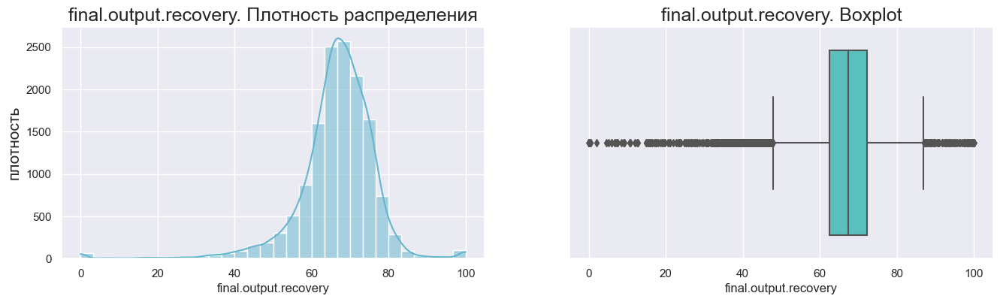

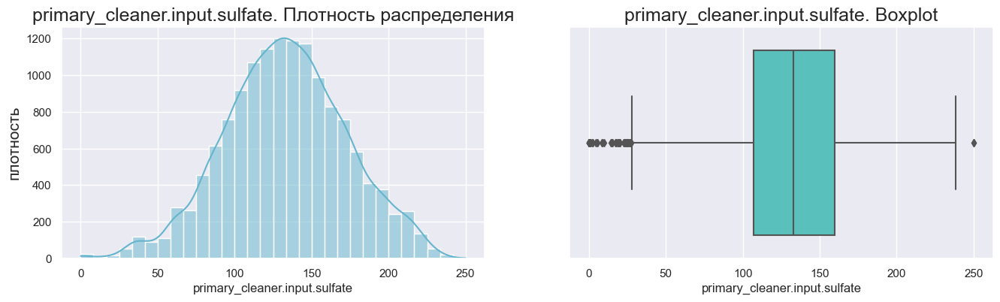

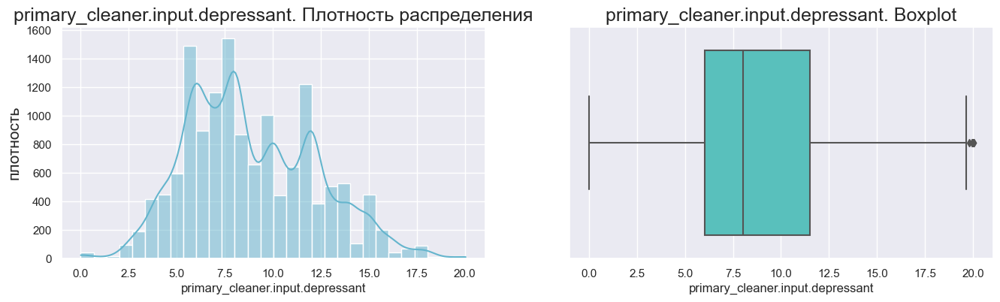

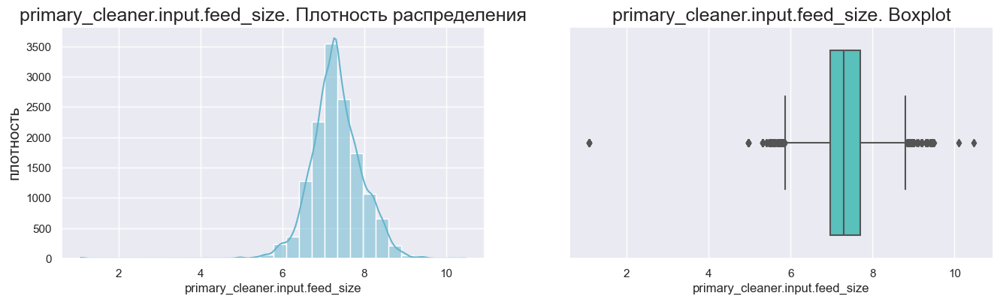

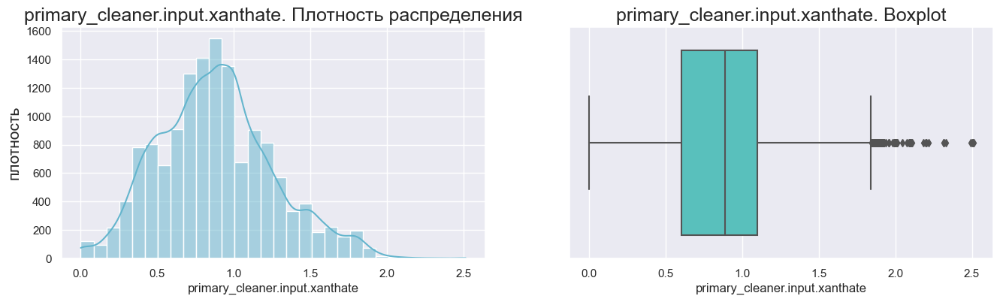

...

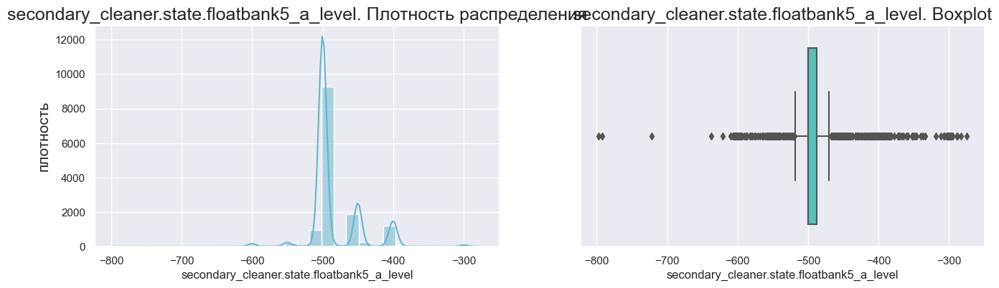

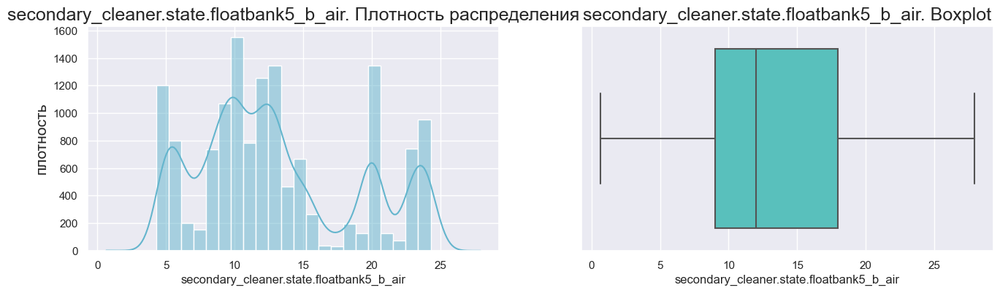

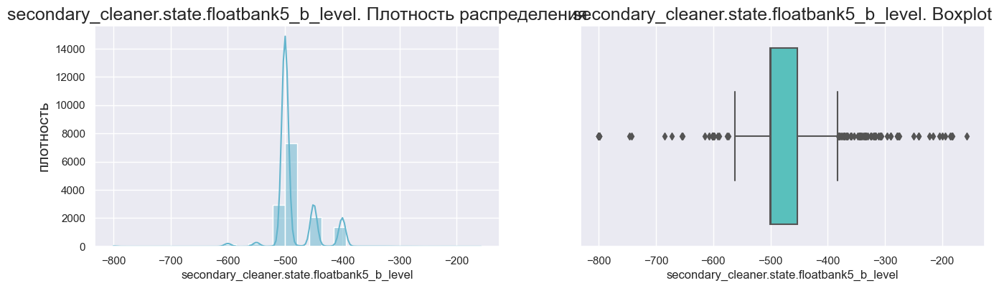

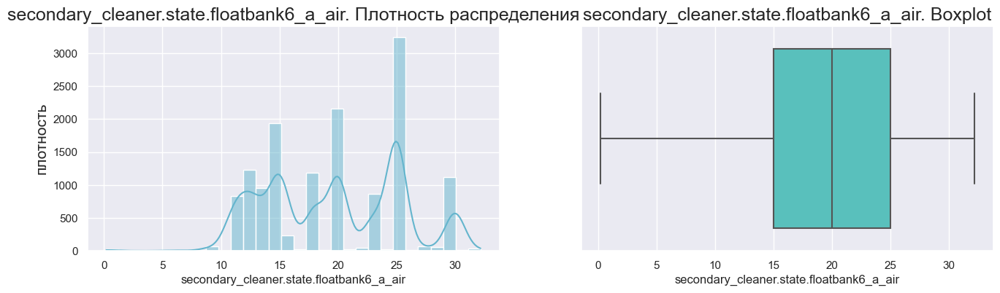

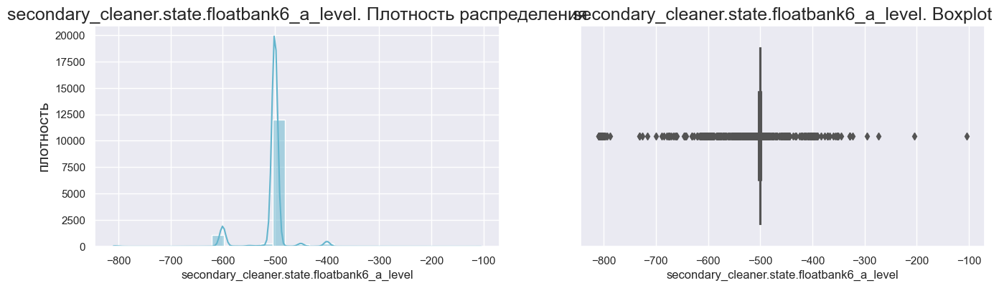

In [62]:
# построим графики
for name in columns_name:
    graph(data_train[name], data_train, name, num_bins=30)

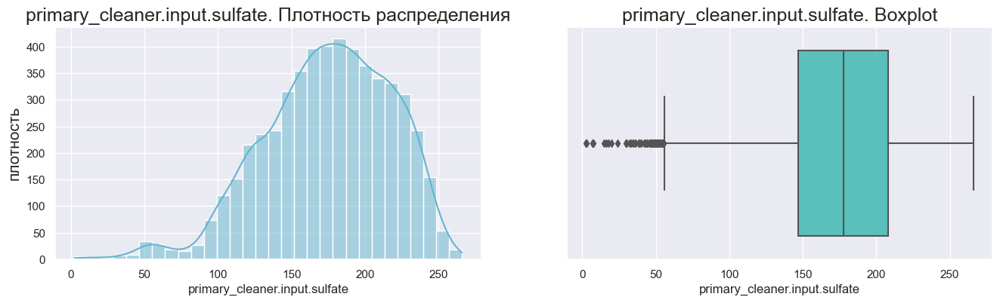

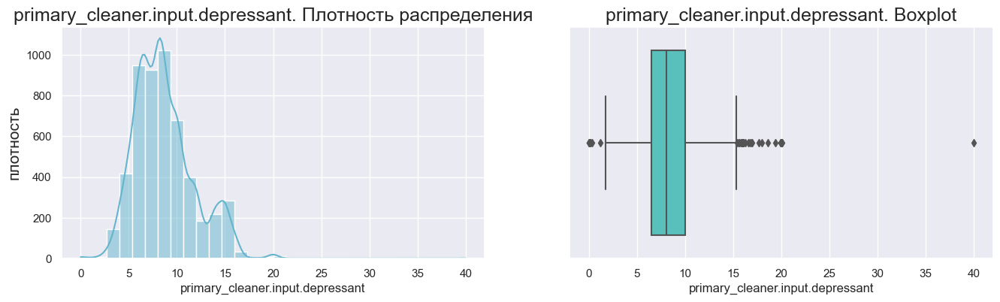

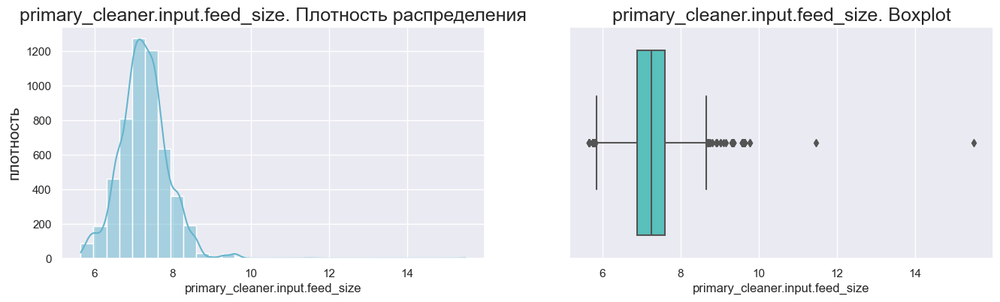

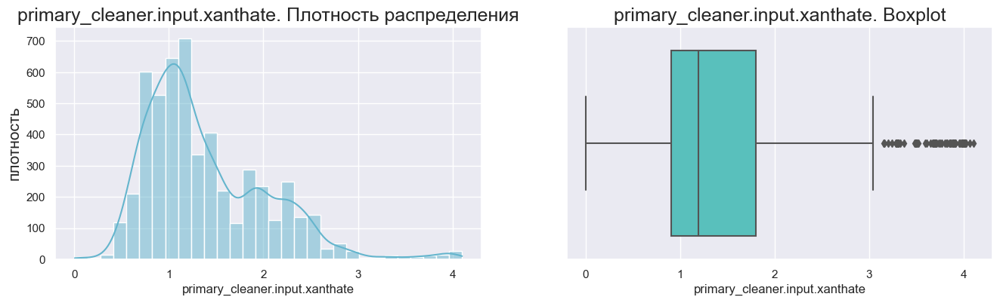

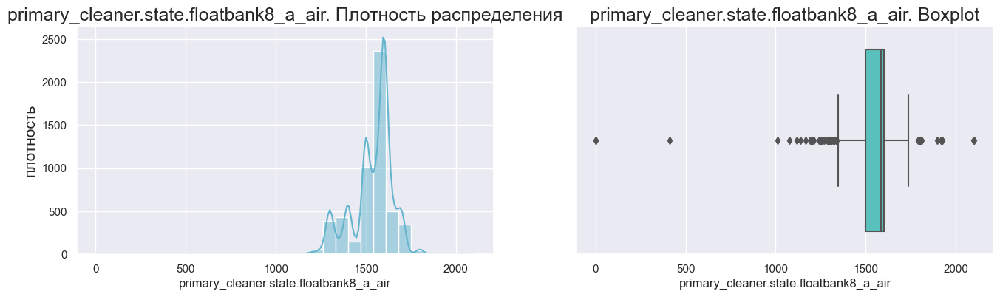

...

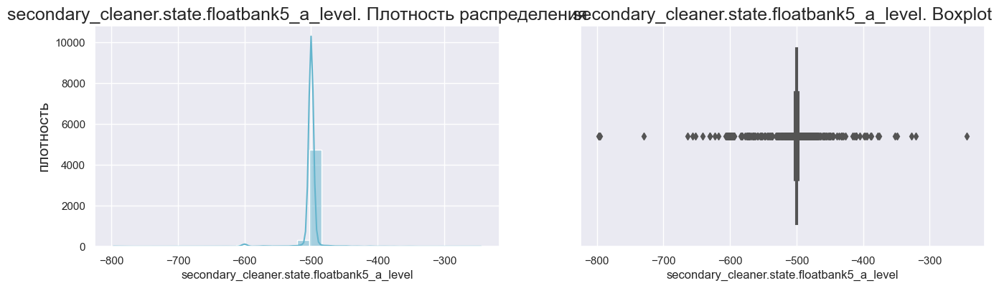

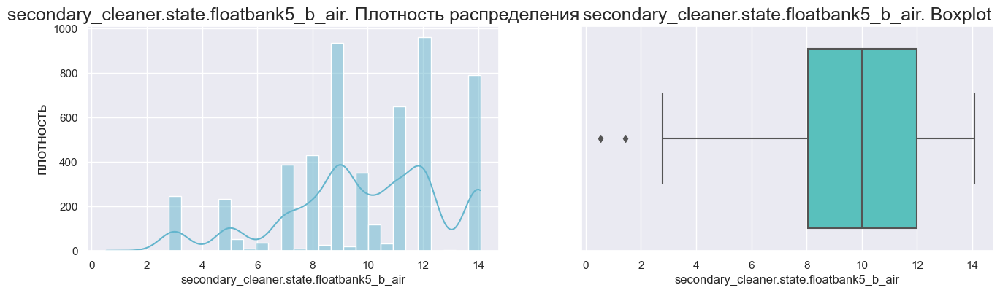

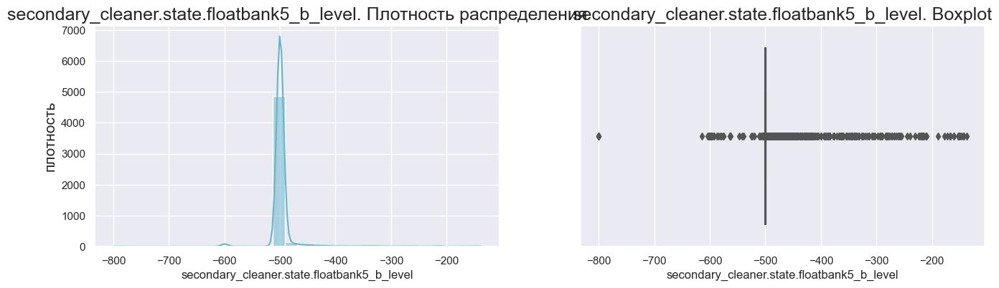

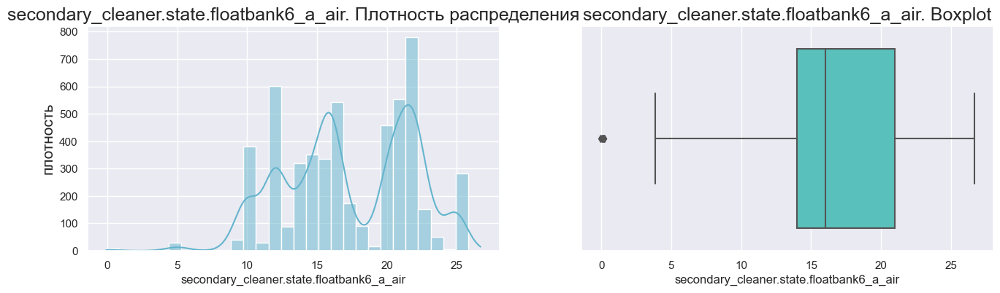

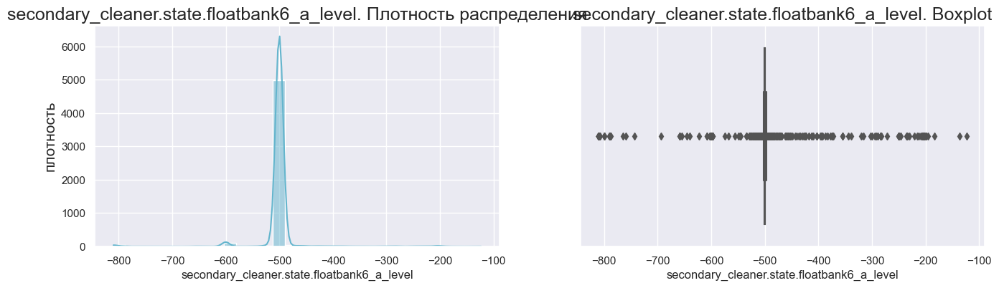

In [63]:
columns_name = data_test.columns
for name in columns_name:
    graph(data_test[name], data_test, name, num_bins=30)

Выбросы имеются как на тестовой, так и на обучающей выборках. Пока удалять их не будем, посмотрим наиболее важные признаки детально и примем решение о необходимости исключения аномалий.

## Анализ данных

### Оценка концентрации металлов (Au, Ag, Pb) на различных этапах очистки

In [64]:
data_full.columns

Index(['final.output.concentrate_ag', 'final.output.concentrate_pb',
       'final.output.concentrate_sol', 'final.output.concentrate_au',
       'final.output.recovery', 'final.output.tail_ag', 'final.output.tail_pb',
       'final.output.tail_sol', 'final.output.tail_au',
       'primary_cleaner.input.sulfate', 'primary_cleaner.input.depressant',
       'primary_cleaner.input.feed_size', 'primary_cleaner.input.xanthate',
       'primary_cleaner.output.concentrate_ag',
       'primary_cleaner.output.concentrate_pb',
       'primary_cleaner.output.concentrate_sol',
       'primary_cleaner.output.concentrate_au',
       'primary_cleaner.output.tail_ag', 'primary_cleaner.output.tail_pb',
       'primary_cleaner.output.tail_sol', 'primary_cleaner.output.tail_au',
       'primary_cleaner.state.floatbank8_a_air',
       'primary_cleaner.state.floatbank8_a_level',
       'primary_cleaner.state.floatbank8_b_air',
       'primary_cleaner.state.floatbank8_b_level',
       'primary_cleaner.state

In [65]:
# выберем признаки относящиеся к концентратам металлов
col_concentrate_ag = []
col_concentrate_au = []
col_concentrate_pb = []
for col in data_full.columns:
    col_split = col.split('.')
    if 'concentrate_ag' in col_split or 'feed_ag' in col_split:
        col_concentrate_ag.append(col)
    elif 'concentrate_au' in col_split or 'feed_au' in col_split:
        col_concentrate_au.append(col)
    elif 'concentrate_pb' in col_split or 'feed_pb' in col_split:
        col_concentrate_pb.append(col)

col_concentrate_ag = list(pd.Series(data=col_concentrate_ag, index=[3,2,0,1]).sort_index())
col_concentrate_au = list(pd.Series(data=col_concentrate_au, index=[3,2,0,1]).sort_index())
col_concentrate_pb = list(pd.Series(data=col_concentrate_pb, index=[3,2,0,1]).sort_index())

In [66]:
# посмотрим распределение значений по этим признакам
data_full[col_concentrate_ag + col_concentrate_au + col_concentrate_pb].describe()

,rougher.input.feed_ag,rougher.output.concentrate_ag,primary_cleaner.output.concentrate_ag,final.output.concentrate_ag,rougher.input.feed_au,rougher.output.concentrate_au,primary_cleaner.output.concentrate_au,final.output.concentrate_au,rougher.input.feed_pb,rougher.output.concentrate_pb,primary_cleaner.output.concentrate_pb,final.output.concentrate_pb
count,19439.000000,19439.000000,19439.000000,19438.000000,19439.000000,19439.000000,19439.000000,19439.000000,19339.000000,19439.000000,19323.000000,19438.000000
mean,8.794927,11.994759,8.442408,5.168470,8.266097,19.772000,32.119400,44.076513,3.598085,7.606272,9.829530,9.978895
std,1.936847,2.733862,2.054465,1.372348,1.955092,3.753600,5.627611,5.129784,1.049486,1.796757,2.556843,1.669240
min,0.010000,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000,0.000000
25%,7.237967,10.628337,7.263288,4.251240,6.854384,18.802523,30.463140,43.402215,2.887280,6.725987,8.702328,9.137262
50%,8.593574,12.098115,8.507298,5.066094,8.125839,20.280214,32.841295,45.011244,3.534895,7.742580,10.152433,10.102433
75%,10.213771,13.736996,9.809001,5.895527,9.769917,21.717843,35.048006,46.275313,4.244161,8.565199,11.424971,11.035769
max,14.596026,24.480271,16.081632,16.001945,13.731330,28.824507,45.933934,52.756638,7.142594,13.617072,17.081278,17.031899


Стандартное отклонение по признакам не большое, разница между средним значением и медианой незначительное.

Воспользуемся медианой для построения графика.

In [67]:
# рассчитаем медианные значения по концентратам
data_concentrate_ag = round(data_full[col_concentrate_ag].median(),2)
data_concentrate_au = round(data_full[col_concentrate_au].median(),2)
data_concentrate_pb = round(data_full[col_concentrate_pb].median(),2)

In [68]:
# построим воронку по концентрации металлов на различных этапах очистки
data = dict(Quantity =  list(data_concentrate_ag) + list(data_concentrate_au) + list(data_concentrate_pb),
            Stage=['сырье (feed)', 'флотация (rougher)','первичная очистка (primary_cleaner)', ' финальный продукт (final)']*3,
            Concentrate=['серебро (ag)']*4 + ['золото (au)']*4 + ['свинец (pb)']*4)
    
fig = px.funnel(data, y='Stage', x='Quantity', color='Concentrate',
                color_discrete_map={"серебро (ag)": "#374B53", "золото (au)": "#617588", "свинец (pb)": "#A4B7C8"}, template="simple_white",
                title='Концентрация металлов (Au, Ag, Pb) на различных этапах очистки', labels={"Stage": ""})
fig.show()

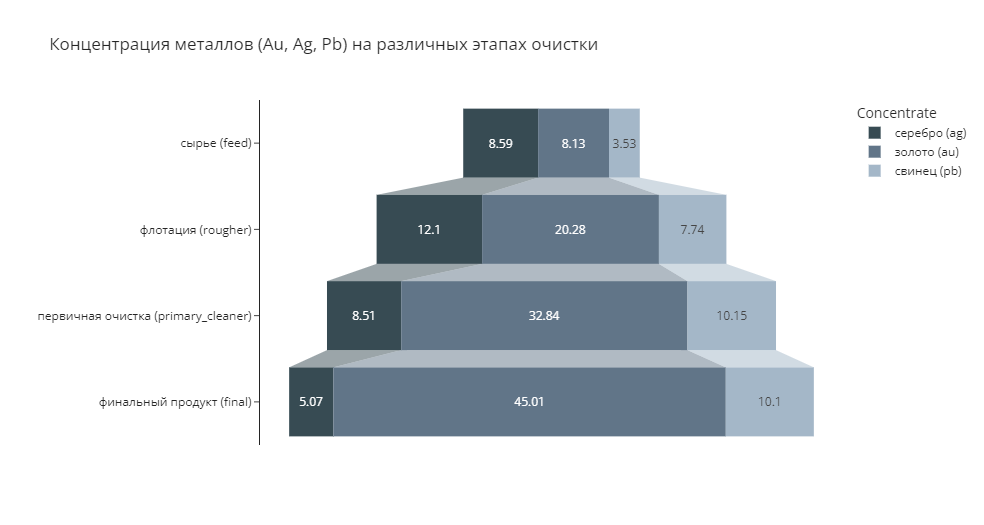

Из графика видно, что:
- концентрация золота с каждым этапом очистки увеличивается, на этапе флотации наблюдается увеличение концентрации более чем в 2 раза;
- свинца растет на этапе флотации и незначительно после первичной очистки, далее практически не меняется;
- концентрация серебра незначительно увеличивается на этапе флотации, далее уменьшается после каждого этапа очистки.

### Оценка распределения размеров гранул сырья на обучающей и тестовой выборках

Сравним распределения размеров гранул сырья на обучающей и тестовой выборках.

In [69]:
# подготовим данные для построения графика распределения
train_feed_size_r = data_train['rougher.input.feed_size'].groupby(data_train.index).agg('median')
test_feed_size_r = data_test['rougher.input.feed_size'].groupby(data_test.index).agg('median')
train_feed_size_p = data_train['primary_cleaner.input.feed_size'].groupby(data_train.index).agg('median')
test_feed_size_p = data_test['primary_cleaner.input.feed_size'].groupby(data_test.index).agg('median')

In [70]:
# построим график по выборкам
# так как выборки разного размера воспользуемся нормализацией
def feed_size_graf(train_feed_size, test_feed_size, name):
    '''строит график распределения по выборкам'''
    f, axes = plt.subplots(1, 1, figsize=(16, 6))
    sns.histplot(train_feed_size, bins=100, color='c', kde=True, stat='density')
    sns.histplot(test_feed_size, bins=100,  kde=True, stat='density')
    plt.title(f'Распределение размеров гранул сырья на обучающей и тестовой выборках ({name})')
    plt.xlabel(f'размер гранул ({name})')
    plt.ylabel('распределение гранул')
    plt.legend(['train_feed_size', 'test_feed_size'])
    plt.show()

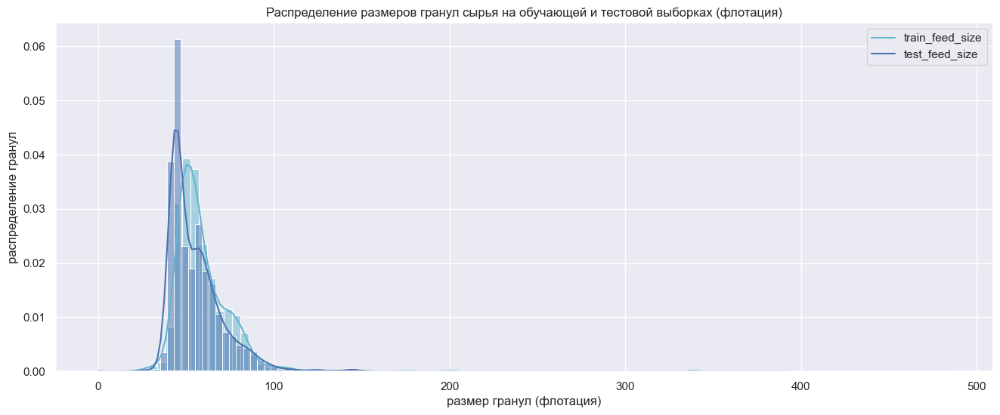

In [71]:
feed_size_graf(train_feed_size_r, test_feed_size_r, 'флотация')

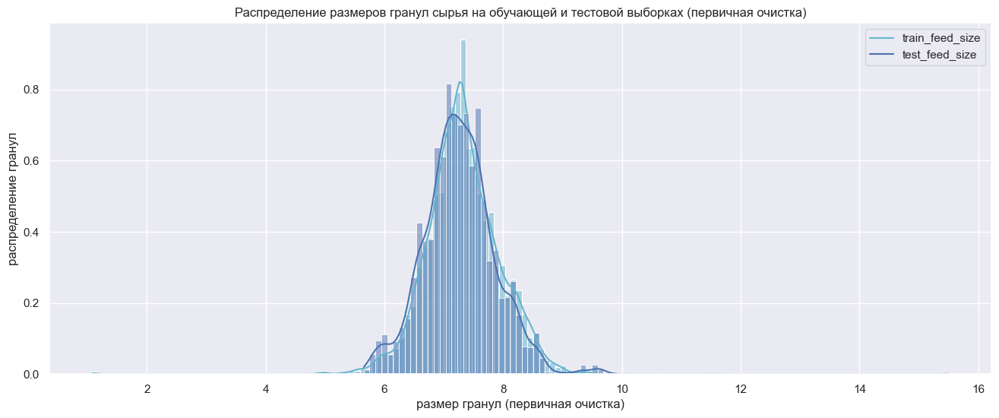

In [72]:
feed_size_graf(train_feed_size_p, test_feed_size_p, 'первичная очистка')

Из графиков видно, что имеются выбросы в размерах гранул, что мы и пытались нивелировать, взяв медиану размера, а не среднее.

Распределение размера гранул на этапе флотации (rougher.input.feed_size) имеет более существенные отличия в выборках, чем при первичной очистке (primary_cleaner.input.feed_size) - там мы видим идентичное распределение размера. Это значит, что можно построить модель для корректного предсказания на тестовой выборке. 

Так как сильной взаимосвязи между признаками нет (по результатам оценки корреляции ранее), то будем использовать оба признака при обучении модели.

### Оценка суммарной концентрации всех веществ на разных стадиях

Исследуем суммарную концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах.

In [73]:
concentrate_feed = data_full['rougher.input.feed_ag'] + data_full['rougher.input.feed_pb'] +\
            data_full['rougher.input.feed_sol'] + data_full['rougher.input.feed_au']
concentrate_rougher = data_full['rougher.output.concentrate_ag'] + data_full['rougher.output.concentrate_pb'] +\
            data_full['rougher.output.concentrate_sol'] + data_full['rougher.output.concentrate_au']
concentrate_primary_cleaner = data_full['primary_cleaner.output.concentrate_ag'] + \
            data_full['primary_cleaner.output.concentrate_pb'] + data_full['primary_cleaner.output.concentrate_sol'] + \
            data_full['primary_cleaner.output.concentrate_au']
concentrate_final = data_full['final.output.concentrate_ag'] + data_full['final.output.concentrate_pb'] +\
            data_full['final.output.concentrate_sol'] + data_full['final.output.concentrate_au']

In [74]:
# создадим функцию для построения графиков по общей концентрации веществ на каждом этапе обработки
def concentrate_all(concentrate_feed, concentrate_rougher, concentrate_primary_cleaner,  concentrate_final):
    f, axes = plt.subplots(1, 1, figsize=(16, 6))
    sns.histplot(concentrate_feed, bins=100, color='c', kde=True)
    sns.histplot(concentrate_rougher, bins=100, color='b', kde=True)
    sns.histplot(concentrate_primary_cleaner, bins=100, color='g', kde=True)
    sns.histplot(concentrate_final, bins=100, color='r', kde=True)
    plt.title(f'Распределение суммарной концентрации всех веществ на разных стадиях обработки')
    plt.xlabel('этапы обработки')
    plt.ylabel('распределение суммарной концентрации веществ')
    plt.legend(['concentrate_feed', 'concentrate_rougher', 'concentrate_primary_cleaner', 'concentrate_final'])
    plt.show()
    
    sns.set()
    f, axes = plt.subplots(4, 1, figsize=(16, 20))
    (sns.boxplot(data=concentrate_feed, x=concentrate_feed, color='c', ax=axes[0])
        .set(title = 'Суммарная концентрация веществ в сырье (concentrate_feed)'))
    (sns.boxplot(data=concentrate_rougher, x=concentrate_rougher, color='b', ax=axes[1])
        .set(title = 'Суммарная концентрация веществ на этапе флотации (concentrate_rougher)'))
    (sns.boxplot(data=concentrate_primary_cleaner, x=concentrate_primary_cleaner, color='g', ax=axes[2])
        .set(title = 'Суммарная концентрация веществ на этапе первичной очистки (concentrate_primary_cleaner)'))
    (sns.boxplot(data=concentrate_final, x=concentrate_final, color='r', ax=axes[3])
        .set(title = 'Суммарная концентрация веществ на финальном этапе (concentrate_final)'))
    plt.show()

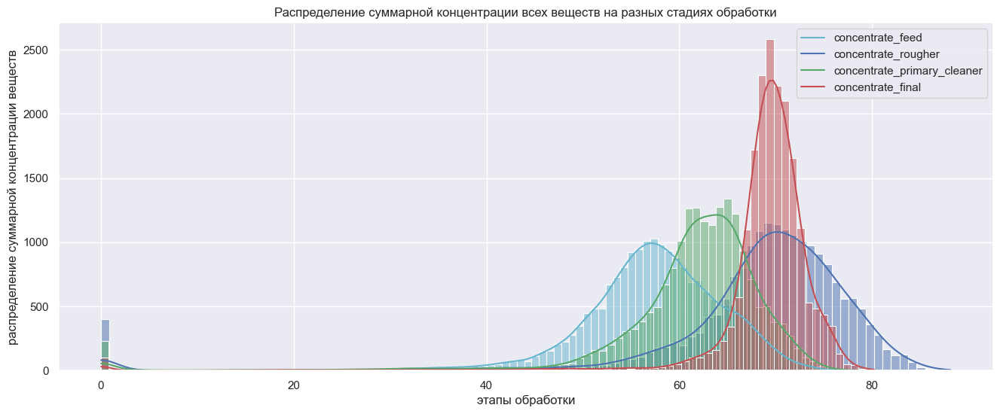

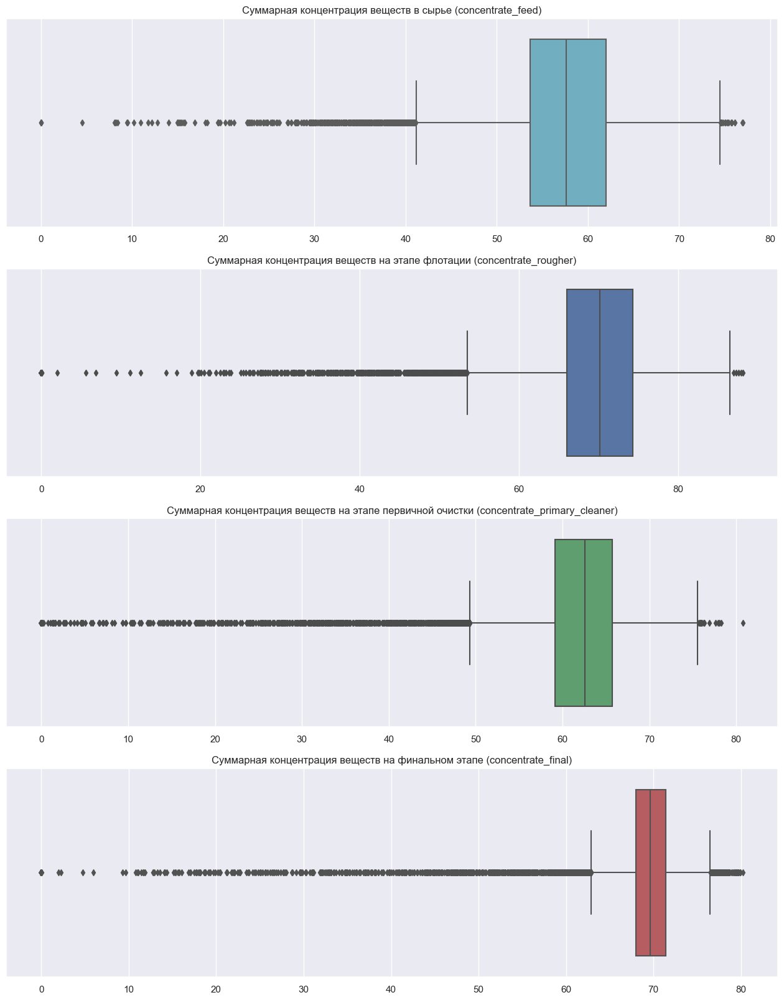

In [75]:
# построим графики
concentrate_all(concentrate_feed, concentrate_rougher, concentrate_primary_cleaner, concentrate_final)

На графиках видно, что имеются выбросы и большое количество нулевых значений. 

В распределении суммарной концентрации веществ на этапах сырья, флотации и финальном этапе имеются явные выбросы, близкие к нулю (0-20). Нулевые значения связаны, скорее всего, с отсутствием их заполнения в определенные периоды - эти данные не несут пользы для построения модели. Уберем эти значения из обучающей и тестовой выборки и оценим процент удаленных значений - проконтролируем, что их не более 5%.

In [76]:
concentrate_feed = concentrate_feed.loc[concentrate_feed > 5]
concentrate_rougher = concentrate_rougher.loc[concentrate_rougher > 15]
concentrate_primary_cleaner = concentrate_primary_cleaner.loc[concentrate_primary_cleaner != 0]
concentrate_final = concentrate_final.loc[concentrate_final > 8]

In [77]:
# удалим выбросы из обучающей выборки
data_train = data_train.loc[data_train.index.intersection(concentrate_feed.index).intersection(concentrate_rougher.index)
                         .intersection(concentrate_primary_cleaner.index).intersection(concentrate_final.index)]

In [78]:
print('Исключено {} объектов'.format(data_full.shape[0] - data_train.shape[0] - data_test.shape[0]))
print('Доля удаленных аномалий:', round((data_full.shape[0] - data_train.shape[0] - data_test.shape[0])/
                                        data_full.shape[0]*100, 0), '%')

Исключено 809 объектов
Доля удаленных аномалий: 4.0 %


Удалили не более 5% базы данных, это допустимо.

Теперь в наших выборках нет пропусков и удалены критичные выбросы. Данные готовы для обучения модели.

## Построение и тестирование модели

### Разделение данных на выборки

In [79]:
# разделение данных для обучения модели
x_train = data_train.drop(['rougher.output.recovery', 'final.output.recovery'], axis=1)
y_train_rougher = data_train['rougher.output.recovery']
y_train_final = data_train['final.output.recovery']
x_test = data_test
y_test_rougher = data_full.loc[data_test.index]['rougher.output.recovery']
y_test_final = data_full.loc[data_test.index]['final.output.recovery']

In [80]:
# удостоверимся, что индексы у таргета и фичей совпадают у тестовой выборки
print((x_test.index == y_test_rougher.index).sum())
print((x_test.index == y_test_final.index).sum())

5290
5290


### Функция для вычисления итоговой sMAPE

Напишем функцию для расчета sMAPE:

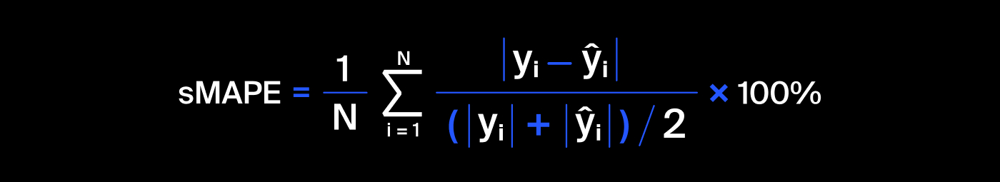

In [81]:
def sMAPE(target, predict):    
    return ((sum((abs(target - predict))/((abs(target) + abs(predict))/2)))/len(target))*100

In [82]:
def sMAPE_total(sMAPE_rougher, sMAPE_final):
    return (0.25 * sMAPE_rougher + 0.75 * sMAPE_final)

In [83]:
smape_score = make_scorer(sMAPE, greater_is_better=False)

### Обучение моделей

#### Подбор гиперпараметров моделей и их обучение

Создадим пайпланы для упрощения работы с моделями. Применим масштабирование в тех моделях, где это необходимо.

In [84]:
Pipeline([('LR', LinearRegression())])
Pipeline([('Scaler', StandardScaler()), ('Ridge', Ridge())]) 
Pipeline([('DecisionTree', DecisionTreeRegressor())])
Pipeline([('Scaler', StandardScaler()), ('Elastic', ElasticNet())])
Pipeline([('Scaler', StandardScaler()), ('Lasso', Lasso())])

Pipeline(steps=[('Scaler', StandardScaler()), ('Lasso', Lasso())])

Теперь создадим параметры, которые будут использованы для подбора в GridSearch.

In [85]:
seed = 12345

In [86]:
# гиперпараметры для разных моделей

ridge_params = {'alpha':np.arange(0.1, 0.6, 0.05)}
ridge_params_2 = {'alpha':np.arange(0.6, 1, 0.05)}

tree_params= {'max_depth':range(5,12,2),
              'min_samples_leaf':range (2,8,2),
              'min_samples_split':range(2,11,2)}

elastic_params = {'alpha':[0.1, 0.3, 0.5, 0.7, 0.9]} #np.arange(0.1, 1, 0.5)}

lasso_params = {'alpha':np.arange(0.1, 1, 0.05)}
            
lasso_params_2 = {'alpha':np.arange(0.1, 1, 0.05),
               'selection':['cyclic', 'random']}

In [87]:
# создадим функции для подбора параметров
def gridsearch_rougher (model, params):
    '''подбирает гиперпараметры к модели с rougher'''
    grid_rougher = GridSearchCV(model, params, scoring=smape_score, cv=5)
    grid_rougher.fit(x_train, y_train_rougher)
    print('Лучшие параметры модели:', grid_rougher.best_params_)
    print(f'{model}','sMAPE rougher: {:.2f}'.format(grid_rougher.best_score_))
    return grid_rougher

In [88]:
def gridsearch_final (model, params):
    '''подбирает гиперпараметры к модели с final'''
    grid_final = GridSearchCV(model, params, scoring=smape_score, cv=5)
    grid_final.fit(x_train, y_train_final)
    print('Лучшие параметры модели:', grid_final.best_params_)
    print(f'{model}','sMAPE final: {:.2f}'.format(grid_final.best_score_))
    return grid_final

Подберем гиперпараметры для моделей.

In [89]:
%%time
grid_ridge_rougher = gridsearch_rougher(Ridge(random_state=seed), ridge_params)
grid_ridge_final = gridsearch_final(Ridge(random_state=seed), ridge_params)

Лучшие параметры модели: {'alpha': 0.5500000000000002}
Ridge(random_state=12345) sMAPE rougher: -7.07
Лучшие параметры модели: {'alpha': 0.5500000000000002}
Ridge(random_state=12345) sMAPE final: -10.06
CPU times: total: 1.73 s
Wall time: 1.55 s


In [90]:
sMAPE_total(grid_ridge_rougher.best_score_, grid_ridge_final.best_score_)

-9.313656101159674

In [91]:
%%time
grid_ridge_rougher_2 = gridsearch_rougher(Ridge(random_state=seed), ridge_params_2)
grid_ridge_final_2 = gridsearch_final(Ridge(random_state=seed), ridge_params_2)

Лучшие параметры модели: {'alpha': 0.9500000000000003}
Ridge(random_state=12345) sMAPE rougher: -7.07
Лучшие параметры модели: {'alpha': 0.9500000000000003}
Ridge(random_state=12345) sMAPE final: -10.06
CPU times: total: 1.16 s
Wall time: 1.4 s


In [92]:
sMAPE_total(grid_ridge_rougher_2.best_score_, grid_ridge_final_2.best_score_)

-9.313448094269217

In [93]:
%%time
grid_tree_rougher = gridsearch_rougher(DecisionTreeRegressor(random_state=seed), tree_params)
grid_tree_final = gridsearch_final(DecisionTreeRegressor(random_state=seed), tree_params)

Лучшие параметры модели: {'max_depth': 7, 'min_samples_leaf': 4, 'min_samples_split': 10}
DecisionTreeRegressor(random_state=12345) sMAPE rougher: -7.39
Лучшие параметры модели: {'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10}
DecisionTreeRegressor(random_state=12345) sMAPE final: -8.96
CPU times: total: 3min 25s
Wall time: 3min 43s


In [94]:
sMAPE_total(grid_tree_rougher.best_score_, grid_tree_final.best_score_)

-8.569714605816806

In [95]:
%%time
grid_elastic_rougher = gridsearch_rougher(ElasticNet(random_state=seed), elastic_params)
grid_elastic_final = gridsearch_final(ElasticNet(random_state=seed), elastic_params)

Лучшие параметры модели: {'alpha': 0.7}
ElasticNet(random_state=12345) sMAPE rougher: -6.22
Лучшие параметры модели: {'alpha': 0.7}
ElasticNet(random_state=12345) sMAPE final: -9.30
CPU times: total: 10.9 s
Wall time: 10.3 s


In [96]:
sMAPE_total(grid_elastic_rougher.best_score_, grid_elastic_final.best_score_)

-8.529193445599342

In [97]:
%%time
grid_lasso_rougher = gridsearch_rougher(Lasso(random_state=seed), lasso_params)
grid_lasso_final = gridsearch_final(Lasso(random_state=seed), lasso_params)

Лучшие параметры модели: {'alpha': 0.40000000000000013}
Lasso(random_state=12345) sMAPE rougher: -6.19
Лучшие параметры модели: {'alpha': 0.5500000000000002}
Lasso(random_state=12345) sMAPE final: -9.32
CPU times: total: 31.2 s
Wall time: 29.7 s


In [98]:
sMAPE_total(grid_lasso_rougher.best_score_, grid_lasso_final.best_score_)

-8.53443337266356

In [99]:
%%time
grid_lasso_rougher_2 = gridsearch_rougher(Lasso(random_state=seed), lasso_params_2)
grid_lasso_final_2 = gridsearch_final(Lasso(random_state=seed), lasso_params_2)

Лучшие параметры модели: {'alpha': 0.40000000000000013, 'selection': 'cyclic'}
Lasso(random_state=12345) sMAPE rougher: -6.19
Лучшие параметры модели: {'alpha': 0.5500000000000002, 'selection': 'random'}
Lasso(random_state=12345) sMAPE final: -9.32
CPU times: total: 1min 31s
Wall time: 1min 26s


In [100]:
sMAPE_total(grid_lasso_rougher_2.best_score_, grid_lasso_final_2.best_score_)

-8.534262390776249

Две модели показали лучшие результаты итогового sMAPE:
- Ridge (-9.31)
- DecisionTreeRegressor (-8.57)

Проверим результаты всех моделей с подобранными гиперпараметрами с помощью кросс-валидации.

#### Оценка лучших моделей с помощью кросс-валидации

In [101]:
%%time
num_folds = 5
grid_models_rougher = {}
grid_models_rougher['LR'] = LinearRegression()
grid_models_rougher['DecisionTree'] = grid_tree_rougher
grid_models_rougher['ScalerRidge'] = grid_ridge_rougher
grid_models_rougher['ScalerRidge_2'] = grid_ridge_rougher_2
grid_models_rougher['ScalerElastic'] = grid_elastic_rougher
grid_models_rougher['ScalerLasso'] = grid_lasso_rougher

grid_models_final = {}
grid_models_final['LR'] = LinearRegression()
grid_models_final['DecisionTree'] = grid_tree_final
grid_models_final['ScalerRidge'] = grid_ridge_final
grid_models_final['ScalerRidge_2'] = grid_ridge_final_2
grid_models_final['ScalerElastic'] = grid_elastic_final
grid_models_final['ScalerLasso'] = grid_lasso_final

results_r2 = []
results_f2 = []
print('sMAPE_rougher')
for key in grid_models_rougher:
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_result = cross_val_score(grid_models_rougher[key], x_train, y_train_rougher, cv=kfold, scoring=smape_score)
    results_r2.append(cv_result)
    print('%s: %f (%f)' % (key, cv_result.mean(), cv_result.std()))

print('sMAPE_final')
for key in grid_models_final:
    kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
    cv_result = cross_val_score(grid_models_final[key], x_train, y_train_final, cv=kfold, scoring=smape_score)
    results_f2.append(cv_result)
    print('%s: %f (%f)' % (key, cv_result.mean(), cv_result.std()))

sMAPE_rougher
LR: -4.584385 (0.064773)
DecisionTree: -4.195333 (0.158455)
ScalerRidge: -4.584377 (0.064776)
ScalerRidge_2: -4.584371 (0.064778)
ScalerElastic: -4.641331 (0.086412)
ScalerLasso: -4.630194 (0.085013)
sMAPE_final
LR: -7.718671 (0.048331)
DecisionTree: -7.452192 (0.121004)
ScalerRidge: -7.718658 (0.048331)
ScalerRidge_2: -7.718649 (0.048332)
ScalerElastic: -7.817901 (0.067019)
ScalerLasso: -7.838810 (0.066405)
CPU times: total: 15min 27s
Wall time: 15min 59s


In [102]:
def graf_model(results, models, name):
    '''строит боксплоты по результатам обучения моделей с метрикой sMAPE'''
    fig = plt.figure(figsize=(17, 7))
    fig.suptitle(f'Результаты обученных моделей по предсказанию {name}')
    ax = fig.add_subplot(111)
    plt.boxplot(results)
    ax.set_xticklabels(models.keys())
    plt.show()

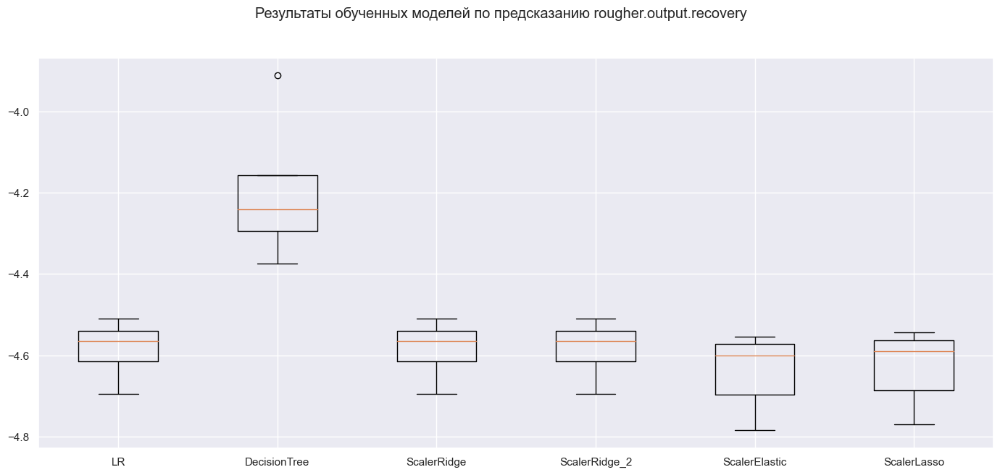

In [103]:
graf_model(results_r2, grid_models_rougher, 'rougher.output.recovery')

Из диаграммы видно, что лучший результат по предсказанию 'rougher.output.recovery' показывает модель ElasticNet и Lasso. Несмотря на то, что Ridge показывает более низкие результаты качества после кросс-валидации, стандартное отклонение у модели ниже, чем у лидеров, а значит, модель дает более стабильный результат.

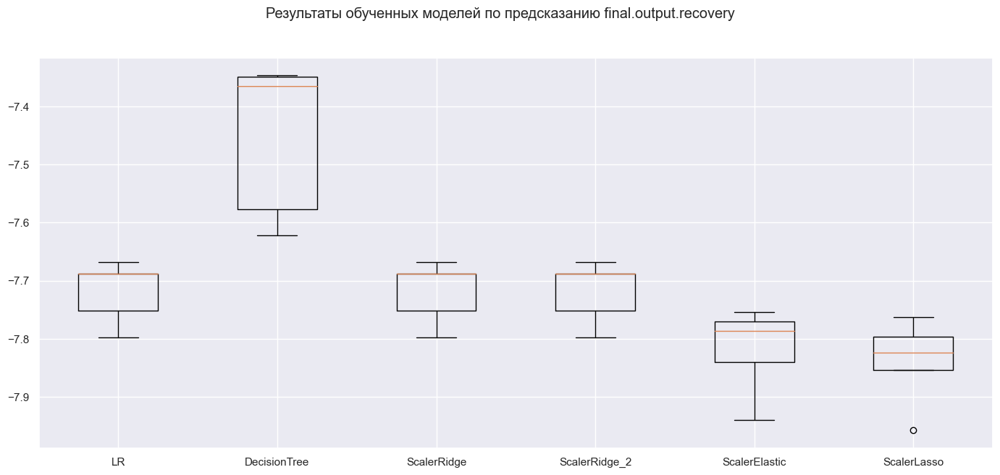

In [104]:
graf_model(results_f2, grid_models_final, 'final.output.recovery')

'final.output.recovery' лучше всего предсказывает модель Lasso, хотя и имеет выбросы - предсказания на одной из выборок отличались более высоким качеством, чем прочие.
На втором месте ElasticNet().

Чтобы сделать окончательный выбор модели, рассчитаем итоговый sMAPE по медианным результатам sMAPE (чтобы нивелировать выбросы)  и сравним результаты.

In [105]:
results_val_r = pd.DataFrame(data=results_r2, index=grid_models_rougher.keys()) 
results_val_f = pd.DataFrame(data=results_f2, index=grid_models_final.keys())

In [106]:
results_val_f_median = results_val_f.median(axis=1)
results_val_r_median = results_val_r.median(axis=1)

In [107]:
for index in results_val_r_median.index:
    print(index, round(sMAPE_total(results_val_r_median[index], results_val_f_median[index]), 4))

LR -6.9076
DecisionTree -6.5845
ScalerRidge -6.9075
ScalerRidge_2 -6.9075
ScalerElastic -6.99
ScalerLasso -7.0155


Модель Lasso показала лучшие результаты после кросс-валидации. Используем ее для тестирования.

#### Тестирование выбранной модели

In [108]:
rougher_pred = grid_lasso_rougher.predict(x_test)
final_pred = grid_lasso_final.predict(x_test)

In [109]:
sMAPE_total(sMAPE(y_test_rougher,rougher_pred),sMAPE(y_test_final,final_pred))

9.06070538500383

Теперь создадим константные модели и сравним метрики.

In [110]:
# создаем константные модели
constant_rougher = make_pipeline(StandardScaler(), DummyRegressor(strategy='mean'))
constant_final = make_pipeline(StandardScaler(), DummyRegressor(strategy='mean'))

In [111]:
# обучим созданные модели
constant_rougher.fit(x_train,y_train_rougher)
constant_final.fit(x_train,y_train_final)
Pipeline([('standardscaler', StandardScaler()), ('dummyregressor', DummyRegressor())])
constant_rougher_pred = constant_rougher.predict(x_test)
constant_final_pred = constant_final.predict(x_test)
sMAPE_total(sMAPE(y_test_rougher,constant_rougher_pred),sMAPE(y_test_final,constant_final_pred))

9.651717395576785

Разница между метрикой по обученной модели Lasso (9.06%) по сравнению с константной моделью (9.65%) не велика (0.59 процентных пункта), однако благодаря модели удалось добиться снижения итогового sMAPE.

## Выводы по результатам проекта

**В ходе проекта были выполнены следующие этапы:**

- Проведена предобработка данных и подготовка их к построению модели.
- Проведен подбор гиперпараметров и проверка моделей кросс-валидацией.
- Обучены и оценены результаты следующих моделей: 

Модель                 | sMAPE_rougher (среднее после кросс-валидации) | sMAPE_final (среднее после кросс-валидации) | итоговый sMAPE 
----------             | --------------------------------------------- | -----------                                 |------
LinearRegression()     | -4.58                                         |  -7.72                                      |-6.91 
Ridge()                | -4.58                                         |  -7.72                                      |-6.91
DecisionTreeRegressor()| -4.20                                         |  -7.45                                      |-6.59
ElasticNet()           | -4.64                                         |  -7.82                                      |-6.99
Lasso()                | -4.63                                         |  -7.84                                      |-7.04



- По результатам кросс-валидации выбрана **модель Lasso с итоговым sMAPE 9.06%**.
- Результаты предсказания модели сравнили с константной моделью, которая показала итоговый sMAPE 9.65%.

Благодаря построенной модели удалось повысить точность (снизить метрику качества) на 0.59 процентных пункта.